# White Balancing [40 pts]

White balancing can help in restoring discolorations in old photographic prints. Use the different white balancing techniques to color correct the following photo (`old-photo.jpg`):

<img src="old-photo.jpg" width="300" />

#### Instructions:
1. Use 3 sub-images for the ground-truth algorithm (e.g. lady's collar, wall, skin).
1. Use the mean and max method for the ground-truth.
1. Use different percentiles for the white patch algorithm (100th, 99th, 95th, 90th).
1. Apply the gray world algorithm.

#### Questions:
1. Discuss the effect of choosing different sub-images and method for the ground-truth algorithm.
1. Discuss the effect of using different percentiles for the white patch algorithm.
1. What white-balancing technique works best?

In [3]:
import os
os.environ['SKIMAGE_DATADIR'] = '/tmp/.skimage_cache'
import numpy as np
import skimage.io as skio
from skimage import img_as_ubyte, img_as_float
from skimage.exposure import histogram, cumulative_distribution
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from scipy.stats import norm
from PIL import Image

In [32]:
old_photo = skio.imread('old-photo.jpg')
titles = ["Lady's Collar", 'Wall', 'Skin']
lcollar = old_photo[220:230, 202:212]
wall = old_photo[160:170, 370:380]
skin = old_photo[150:160, 240:250]
patch = [lcollar, wall, skin]

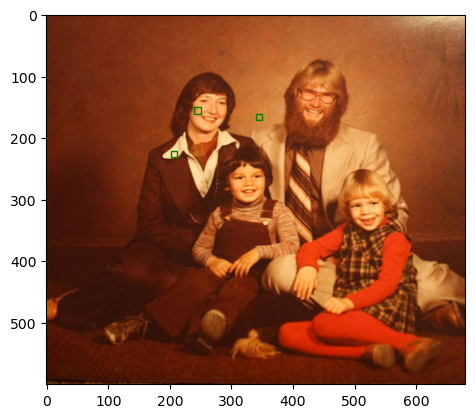

In [33]:
fig0, ax0 = plt.subplots()
ax0.imshow(old_photo)
ax0.add_patch(Rectangle((202, 220), 10, 10, edgecolor='g', facecolor='none'));
ax0.add_patch(Rectangle((340, 160), 10, 10, edgecolor='g', facecolor='none'));
ax0.add_patch(Rectangle((240, 150), 10, 10, edgecolor='g', facecolor='none'));

## 3 sub-images for the ground-truth algorithm

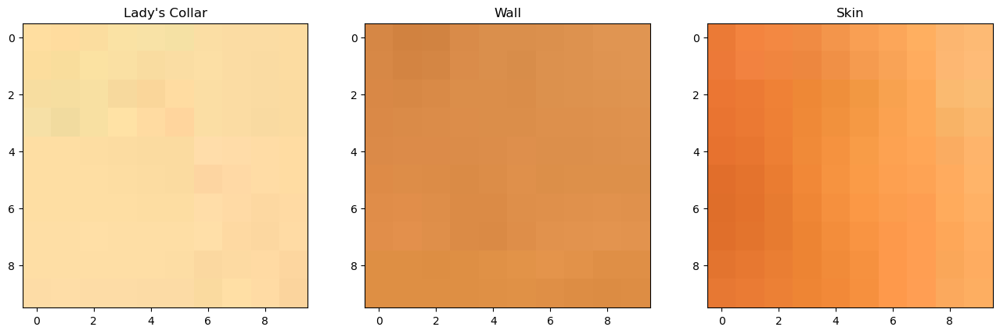

In [34]:
fig, ax = plt.subplots(1,3, figsize=[16, 9])
for idx, p in enumerate(patch):
    ax[idx].imshow(patch[idx])
    ax[idx].set_title(titles[idx])

## Mean and max method for ground truth

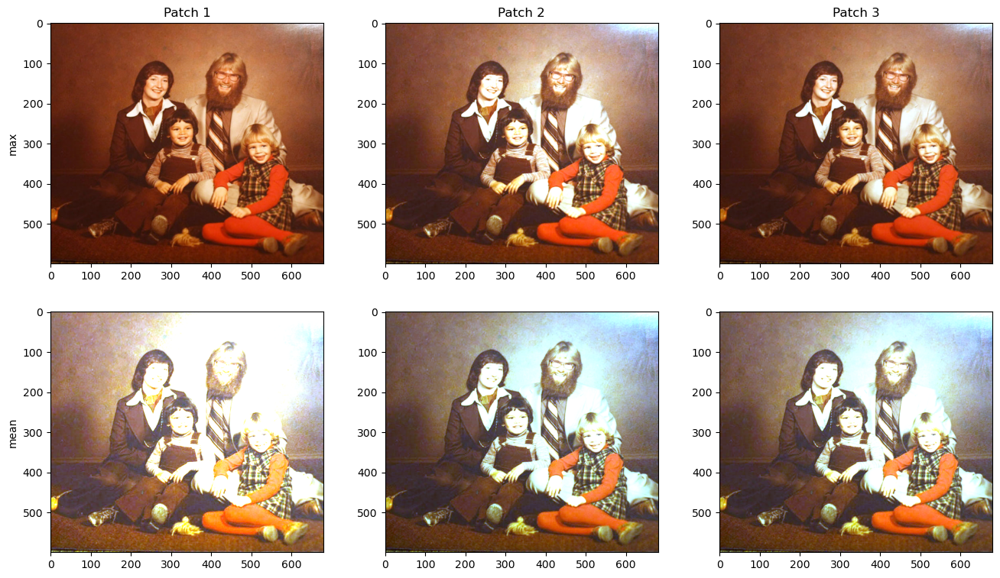

In [38]:
modes = ['max', 'mean']
ground_truth = {mode: [] for mode in modes}

for mode in modes:
    for p in patch:
        if mode == 'max':
            ground_truth[mode].append((old_photo*1.0 / p.max(axis=(0, 1))).clip(0, 1))
        elif mode == 'mean':
            ground_truth[mode].append(((old_photo * (p.mean() / old_photo.mean(axis=(0, 1))))
                  .clip(0, 255).astype(int)))

fig1, ax1 = plt.subplots(2,3, figsize=[16, 9])
for idx, mode in enumerate(modes):
    for idy, p in enumerate(patch):
        ax1[idx][idy].imshow(ground_truth[mode][idy])
        if idx == 0:
            ax1[idx][idy].set_title(titles[idy])
        if idy == 0:
            ax1[idx][idy].set_ylabel(modes[idx])

## White patch algorithm

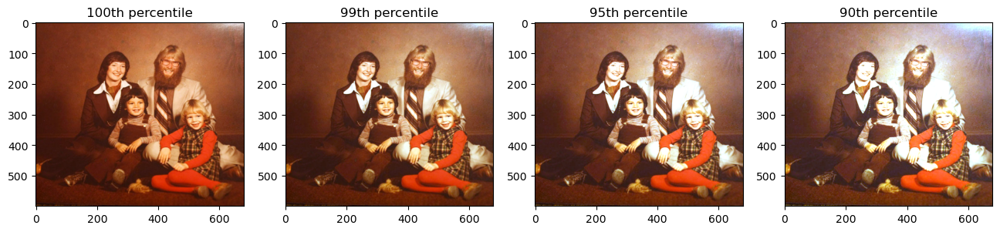

In [42]:
percentages = [100, 99, 95, 90]
old_photo_white = img_as_ubyte(old_photo*1.0 / old_photo.max(axis=(0,1)))
fig2, ax2 = plt.subplots(1, 4, figsize=[16, 9])

for idx, pct in enumerate(percentages):
    old_photo_white2 = img_as_ubyte((old_photo_white*1.0 / np.percentile(old_photo_white, pct, axis=(0, 1)))
                          .clip(0, 1))
    ax2[idx].imshow(old_photo_white2)
    ax2[idx].set_title(f'{pct}th percentile')
plt.show()

## Gray world algorithm

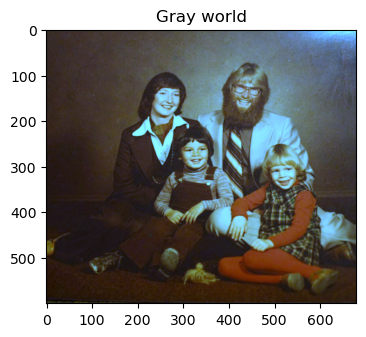

In [43]:
old_photo_gray = ((old_photo * (old_photo.mean() / old_photo.mean(axis=(0, 1))))
             .clip(0, 255).astype(int))
plt.figure('gw', figsize=[4,4])
plt.imshow(old_photo_gray)
plt.title('Gray world')
plt.show()

## Questions

Q1: The choice of the patch can affect the overall image quality. For instance, if we use a patch from a white wall, we may oversaturate other bright features like skin or clothing. The method we use to scale the pixel values also affects the result. The 'max' method assumes that the patch's maximum RGB values should represent white, while the 'mean' method scales the pixel values using the ratio of the mean values of the patch and the image. This method assumes equal distribution of R, G, and B values in the image, which is similar to the gray-world algorithm.

Q2: Different percentiles can be used in the white patch algorithm to adjust the balance between color channels. The algorithm tries to balance the effect of scaling on different color channels, with a penalty for channels that have a distribution concentrated on high values (such as red in this sepia image). By gradually decreasing the percentile threshold, the penalty for green and blue decreases more rapidly than for red. This results in a more equalized distribution of values across the channels, with lower percentiles leading to more white (oversaturated) areas in the image.

Q3: In terms of which white-balancing technique works best, it really depends on the specific image and the availability of a suitable white patch. For this particular image, the Ground truth technique using the cheek patch seemed to work well since it maintained high contrast and fine features were visible without oversaturating the image. However, each technique has its own strengths and weaknesses depending on the image and the assumptions made by the algorithm.

# Histogram manipulation [40 pts]
We discussed histogram manipulation to fix grayscale images. Apply the same technique to the RGB channels of `dark_image.png` to create a corrected RGB image.

<img src="dark_image.png" width="300" />

#### Instructions:
1. Using the technique discussed, correct each channel separately.
1. Aside from the linear and gaussian PDF/CDF, implement an additional PDF/CDF to correct the image. Be creative. Make sure that your CDF is increasing to 255.

#### Question:
1. Describe the results of correcting the image in RGB.
1. What CDF worked best for this scenario?

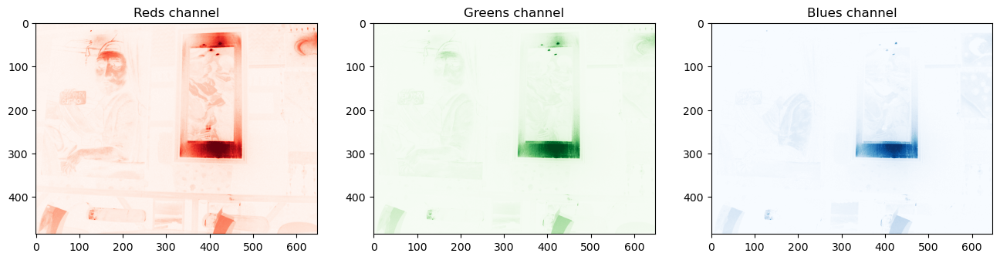

In [80]:
d_img = skio.imread('dark_image.png')
d_img_white_balance = d_img *1.0/ d_img.max(axis=(0,1))
colors = ['red', 'green', 'blue']
color_maps = ['Reds', 'Greens', 'Blues']

for idx, color in enumerate(colors):
    color_channels.append(img_as_ubyte(d_img_white_balance[:, :, idx]))

fig4, ax4 = plt.subplots(1, 3, figsize=[16, 9])
for idx, color_map in enumerate(color_maps):
    ax4[idx].imshow(color_channels[idx], cmap=color_map)
    ax4[idx].set_title(f'{color_map} channel')

fig4.show()

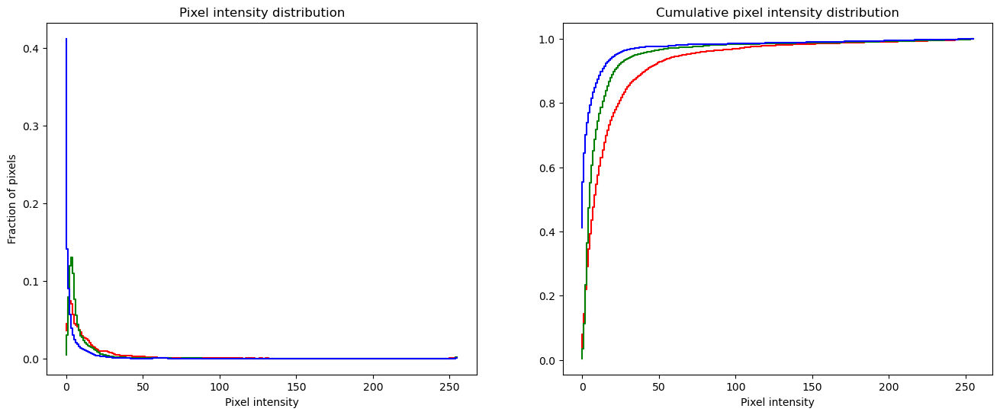

In [92]:
histograms = []
bins_list = []
cumulative_histograms = []
cumulative_bins_list = []

for idx, color in enumerate(colors):
    hist, bins = histogram(color_channels[idx])
    chist, cbins = cumulative_distribution(color_channels[idx])
    histograms.append(hist)
    bins_list.append(bins)
    cumulative_histograms.append(chist)
    cumulative_bins_list.append(cbins)

fig3, ax3 = plt.subplots(1, 2, figsize=[16, 6])
for idx, color in enumerate(colors):
    hist = histograms[idx]
    chist = cumulative_histograms[idx]
    ax3[0].step(bins_list[idx], hist*1.0/hist.sum(), color=color)
    ax3[1].step(cumulative_bins_list[idx], chist, color=color)
    
ax3[0].set_xlabel('Pixel intensity')
ax3[0].set_ylabel('Fraction of pixels')
ax3[0].set_title('Pixel intensity distribution')
ax3[1].set_xlabel('Pixel intensity')
ax3[1].set_title('Cumulative pixel intensity distribution')
fig3.show()

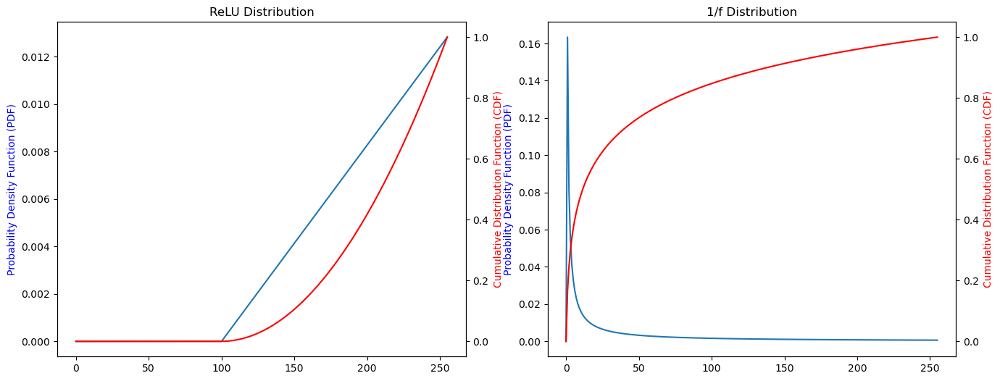

In [91]:
linear_intensity_bins = np.arange(255)
linear_intensity_freq = np.linspace(0, 1, len(linear_intensity_bins))

gaussian_mean = 128
gaussian_std = 64
gaussian_distribution = norm(gaussian_mean, gaussian_std)
gaussian_intensity_freq = gaussian_distribution.cdf(np.arange(0, 256))
gaussian_intensity_bins = np.arange(0, 256)

relu_bins = np.arange(0, 256)
threshold = 100
relu_values = [0 if i<threshold else i-threshold for i in relu_bins]
relu_pdf = relu_values / np.sum(relu_values)
relu_cdf = np.cumsum(relu_pdf)

pink_bins = np.arange(0, 256)
pink_values = [1/i if i>0 else 0 for i in pink_bins]
pink_pdf = pink_values / np.sum(pink_values)
pink_cdf = np.cumsum(pink_pdf)

fig6, ax6 = plt.subplots(1, 2, figsize=[16, 6])
relu_ax = ax6[0].twinx()
pink_ax = ax6[1].twinx()
ax6[0].plot(relu_bins, relu_pdf)
ax6[0].set_ylabel('Probability Density Function (PDF)', color='b')
ax6[0].set_title('ReLU Distribution')
relu_ax.plot(relu_bins, relu_cdf, c='r')
relu_ax.set_ylabel('Cumulative Distribution Function (CDF)', color='r')
ax6[1].plot(pink_bins, pink_pdf)
ax6[1].set_ylabel('Probability Density Function (PDF)', color='b')
ax6[1].set_title('1/f Distribution')
pink_ax.plot(pink_bins, pink_cdf, c='r')
pink_ax.set_ylabel('Cumulative Distribution Function (CDF)', color='r')

fig6.show()

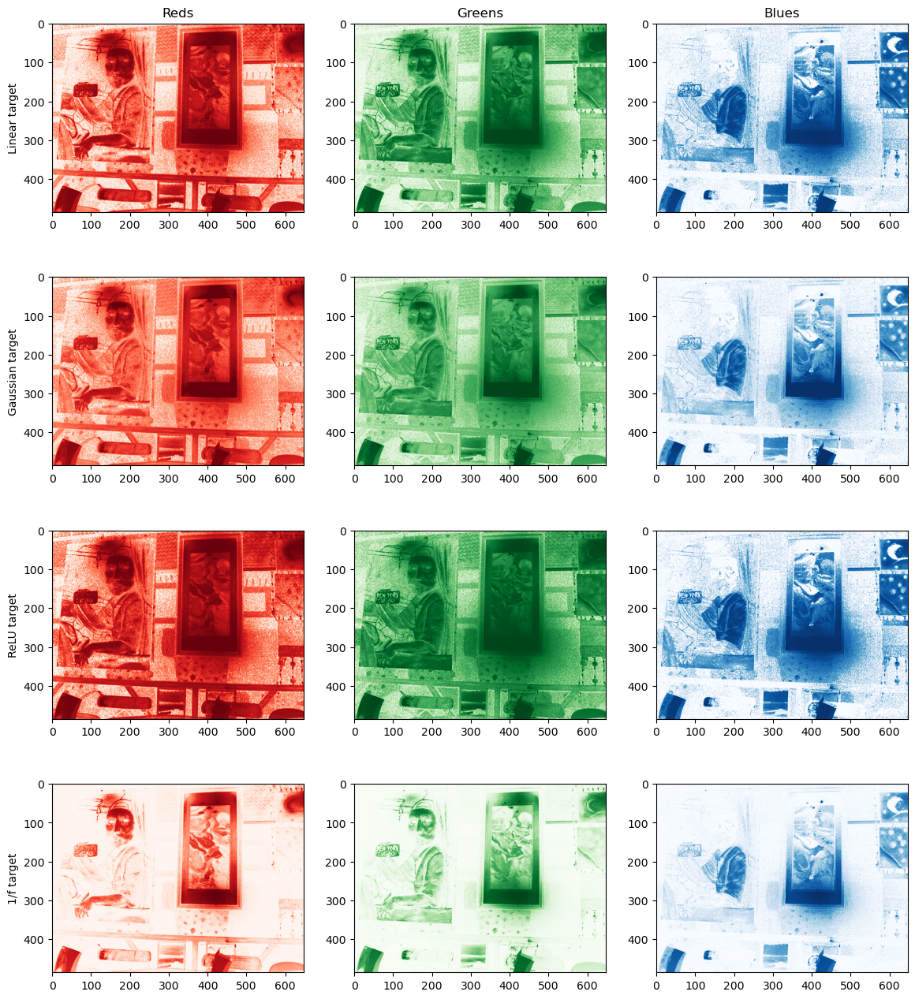

In [88]:
linear_outputs = []
gaussian_outputs = []
triangle_outputs = []
pink_outputs = []

for idx, color in enumerate(colors):
    linear_interp = np.interp(channel_cfreqs[idx], linear_freq, linear_bins)
    linear_outputs.append(img_as_ubyte(linear_interp[di_channels[idx]]
                                    .astype(int)))
    gaussian_interp = np.interp(channel_cfreqs[idx], 
                              gaussian_freq, gaussian_bins)
    gaussian_outputs.append(img_as_ubyte(gaussian_interp[di_channels[idx]]
                                    .astype(int)))
    triangle_interp = np.interp(channel_cfreqs[idx], 
                              triangle_freq, triangle_bins)
    triangle_outputs.append(img_as_ubyte(triangle_interp[di_channels[idx]]
                                    .astype(int)))
    pink_interp = np.interp(channel_cfreqs[idx], pink_freq, pink_bins)
    pink_outputs.append(img_as_ubyte(pink_interp[di_channels[idx]]
                                    .astype(int)))
    
fig5, ax5 = plt.subplots(4, 3, figsize=[14, 16])
for idx, cm in enumerate(cmaps):
    ax5[0][idx].imshow(linear_outputs[idx], cmap=cm)
    ax5[0][idx].set_title(f'{cm}')
    ax5[1][idx].imshow(gaussian_outputs[idx], cmap=cm)
    ax5[2][idx].imshow(triangle_outputs[idx], cmap=cm)
    ax5[3][idx].imshow(pink_outputs[idx], cmap=cm)
    if idx == 0:
        ax5[0][idx].set_ylabel('Linear target')
        ax5[1][idx].set_ylabel('Gaussian target')
        ax5[2][idx].set_ylabel('ReLU target')
        ax5[3][idx].set_ylabel('1/f target')

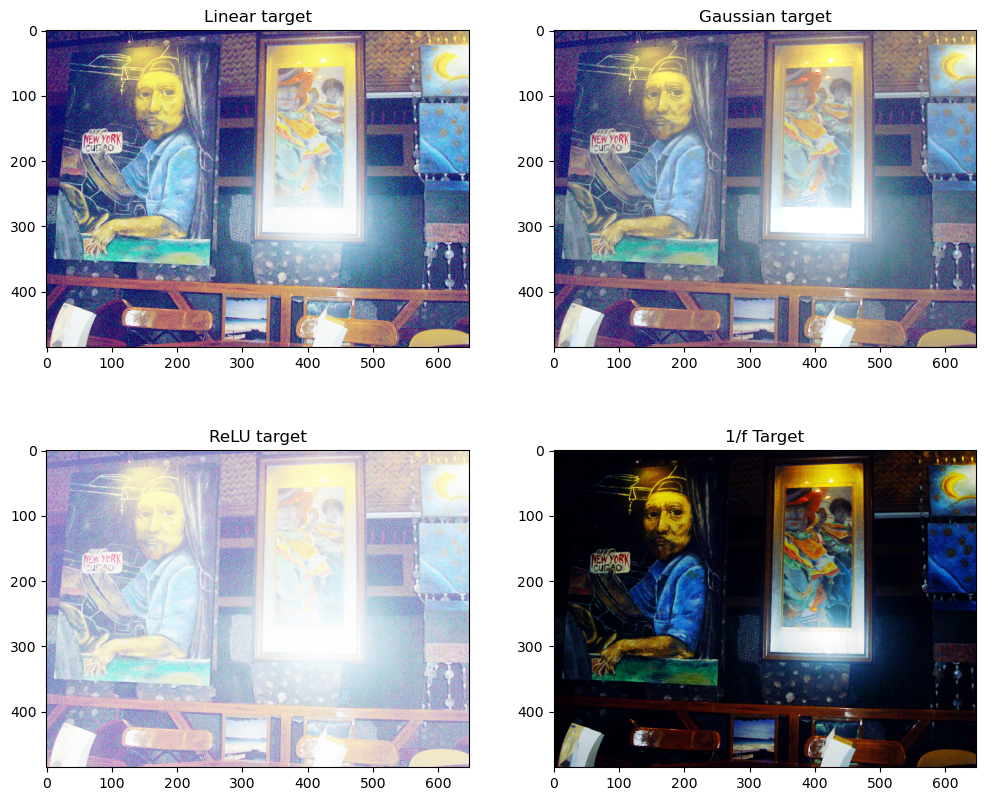

In [97]:
linear = np.dstack(linear_outputs)
gaussian = np.dstack(gaussian_outputs)
triangle = np.dstack(triangle_outputs)
pink = np.dstack(pink_outputs)

fig7, ax7 = plt.subplots(2, 2, figsize=[12, 10])
ax7[0][0].imshow(linear)
ax7[0][0].set_title('Linear target')
ax7[0][1].imshow(gaussian)
ax7[0][1].set_title('Gaussian target')
ax7[1][0].imshow(triangle)
ax7[1][0].set_title('ReLU target')
ax7[1][1].imshow(pink)
ax7[1][1].set_title('1/f Target')
fig7.show()

## Questions

Q1: Correcting an RGB image using histogram manipulation changes the pixel value distribution to match a target distribution. The Linear and Gaussian distributions have similar CDFs and result in more separation between colors. The Gaussian distribution favors middle pixel values, resulting in less glare and dark regions. The ReLU and 1/f distributions favor extreme pixel values, resulting in bright and dark corrected images, respectively. Separating channels allows for different target distributions for each channel and more flexibility in generating corrected images.

Q2: The Gaussian distribution was the best for enhancing image details while minimizing glare, but for preserving the artwork's colors without oversaturating brightness, the 1/f target distribution was more effective.

# Enhancement in the frequency domain [40 pts]

One of the applications of data science and machine learning in art is the classification and prediction of artists using brush strokes in paintings. However the texture of the surface of the canvass can be classified as noise. Using the frequency domain, you can remove the texture of an image. Consider the following image (`paint.JPG`):

<img src="paint.JPG" width="300" />

#### Instructions:
1. Using the technique discussed, apply enhancement in the frequency domain to remove as much noise as you can from the image.
1. For bonus points, enhance the image with the RGB channels.

#### Questions:
1. How did you create the mask for this image?
1. What happens if you mask the central spot of the frequency domain?

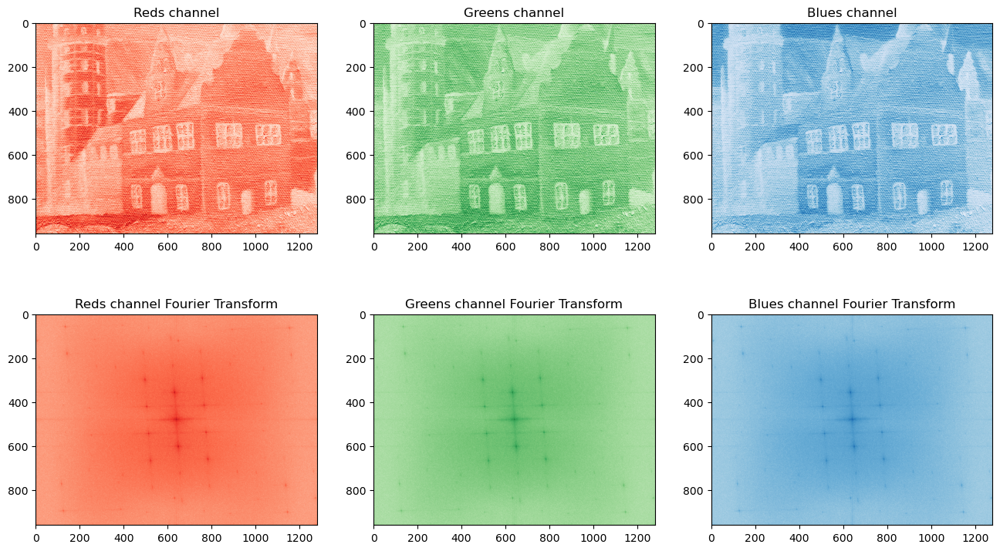

In [103]:
paint_jpg = skio.imread('paint.JPG')
color_channels = []
color_channel_fourier = []

for idx, color in enumerate(colors):
    color_channel = img_as_ubyte(paint_jpg[:, :, idx])
    color_channels.append(color_channel)
    color_channel_fourier.append(np.fft.fftshift(np.fft.fft2(color_channel)))

fig8, ax8 = plt.subplots(2, 3, figsize=[16, 9])
for idx, cm in enumerate(cmaps):
    ax8[0][idx].imshow(color_channels[idx], cmap=cm)
    ax8[0][idx].set_title(f'{cm} channel')
    ax8[1][idx].imshow(np.log(abs(color_channel_fourier[idx])), cmap=cm)
    ax8[1][idx].set_title(f'{cm} channel Fourier Transform')

fig8.show()

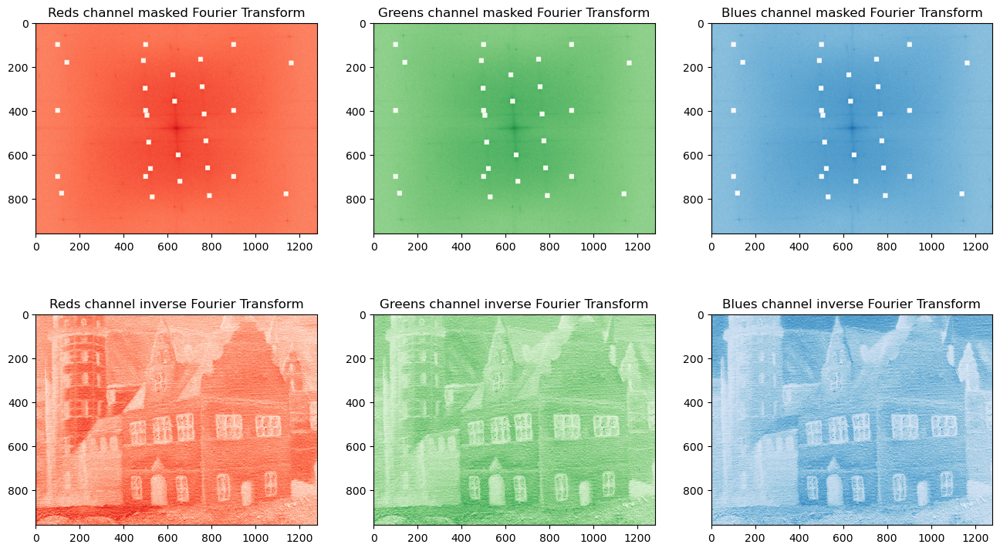

In [114]:
filter_points = np.array([[100, 100], [100, 500], [100, 900], 
                          [400, 100], [400, 500], [400, 900], 
                          [700, 100], [700, 500], [700, 900]])
mask = color_channel_fourier.copy()

size = 10
for point in filter_points:
    x, y = point
    for idx, color in enumerate(colors):
        mask[idx][x][y] = 1
        for i in np.arange(-size, size+1):
            for j in np.arange(-size, size+1):
                mask[idx][x+i][y+j] = 1

inverse_fourier = []
fig9, ax9 = plt.subplots(2, 3, figsize=[16, 9])
for idx, cm in enumerate(cmaps):
    ax9[0][idx].imshow(np.log(abs(mask[idx])), cmap=cm)
    ax9[0][idx].set_title(f'{cm} channel masked Fourier Transform')
    ax9[1][idx].imshow(abs(np.fft.ifft2(mask[idx])), cmap=cm)
    ax9[1][idx].set_title(f'{cm} channel inverse Fourier Transform')
    inverse_fourier.append(abs(np.fft.ifft2(mask[idx])))
    
fig9.show()

## Bonus

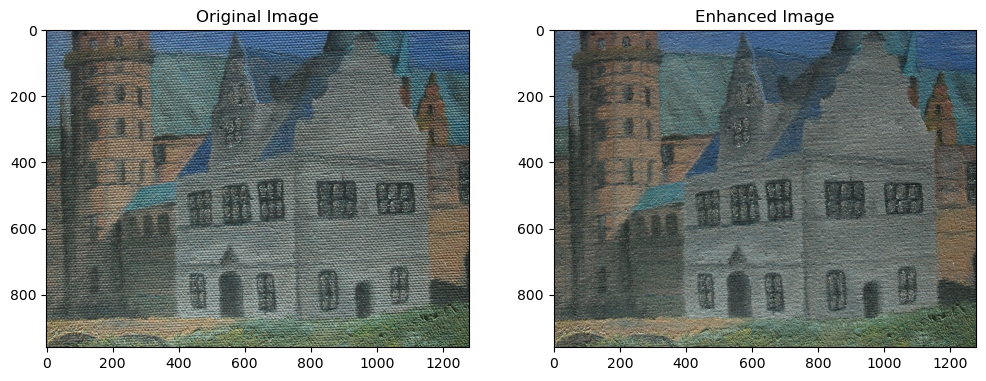

In [117]:
inverse_fourier_img = np.dstack(inverse_fourier)
inverse_fourier_img = inverse_fourier_img / inverse_fourier_img.max()

fig10, ax10 = plt.subplots(1, 2, figsize=[12, 4.5])
ax10[0].imshow(paint_jpg)
ax10[0].set_title('Original Image')
ax10[1].imshow(inverse_fourier_img)
ax10[1].set_title('Enhanced Image')
fig10.show()

## Questions

Q1: To capture the rotated high-frequency pattern of the noise, square masks were chosen instead of vertical or horizontal masks. The masks needed to reach the edges of the frequency domain to capture the peaks created by the noise. The peak locations were found manually.

Q2: Masking the central spot of the frequency domain results in a darker image because it filters out large patterns near the DC component, where most of the image energy is located.

## Grading Rubric for each problem:
* 20pts : Code and Results - Implemented the algorithm properly.
* 20pts : Write up - Answered the questions meaningfully with learning take aways.